In [ ]:
#Text Visualization
!pip3 install wordcloud nltk gensim networkx
!pip3 install pandas matplotlib geopandas
!pip3 install descartes shifterator

#Temporal & Geospatial Visualization
!pip3 install pandas matplotlib geopandas numpy seaborn

#Nertwork Visualization
!pip install networkx matplotlib

#Hierarchical Visualization
!pip3 install pandas networkx matplotlib plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 5.1 MB/s 
     |████████████████████████████████| 16.6 MB 34.8 MB/s 
     |████████████████████████████████| 7.8 MB 38.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 40.4 MB 1.3 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

#Text Visualization
import re
from collections  import Counter, defaultdict
from wordcloud import WordCloud
from gensim import corpora, models
import shifterator as shifterator
import nltk
from nltk.corpus import stopwords

#Temporal Visualization
import numpy as np
import seaborn as sns
import matplotlib.ticker as ticker
import plotly.graph_objects as go
from matplotlib.projections.polar import RadialAxis
import datetime 

#Geospatial Visualization
import plotly
import plotly.express as px

#Geo-temporal Visualization
import plotly.offline as po

#Network Visualization
import networkx as nx
from networkx.drawing.layout import bipartite_layout

#Hierarchical Visualization
import plotly.express as px
import networkx as nx

###**Load the Dataset CSV files from GDrive**

#### College Majors Dataset

In [ ]:
url = 'https://drive.google.com/file/d/1uNWJRgYx6xPl7OUs_1VMAAXKCXyLbIQF/view?usp=sharing'
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
college_majors = pd.read_csv(path)
college_majors.head()

,Rank,Major_code,Major,Total,Men,Women,Major_category,ShareWomen,Sample_size,Employed,...,Part_time,Full_time_year_round,Unemployed,Unemployment_rate,Median,P25th,P75th,College_jobs,Non_college_jobs,Low_wage_jobs
0,1,2419,PETROLEUM ENGINEERING,2339.0,2057.0,282.0,Engineering,0.1206,36,1976,...,270,1207,37,0.0184,110000,95000,125000,1534,364,193
1,2,2416,MINING AND MINERAL ENGINEERING,756.0,679.0,77.0,Engineering,0.1019,7,640,...,170,388,85,0.1172,75000,55000,90000,350,257,50
2,3,2415,METALLURGICAL ENGINEERING,856.0,725.0,131.0,Engineering,0.1530,3,648,...,133,340,16,0.0241,73000,50000,105000,456,176,0
3,4,2417,NAVAL ARCHITECTURE AND MARINE ENGINEERING,1258.0,1123.0,135.0,Engineering,0.1073,16,758,...,150,692,40,0.0501,70000,43000,80000,529,102,0
4,5,2405,CHEMICAL ENGINEERING,32260.0,21239.0,11021.0,Engineering,0.3416,289,25694,...,5180,16697,1672,0.0611,65000,50000,75000,18314,4440,972


#### College Tuition, Diversity, and Pay Dataset

In [ ]:
url = 'https://drive.google.com/file/d/1MhIki9lAnAG9xcvqDpBM_TIw3HKg8u6l/view?usp=share_link'
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
historical_tuition = pd.read_csv(path)
historical_tuition.head()

,type,year,tuition_type,tuition_cost
0,All Institutions,1985-86,All Constant,10893
1,All Institutions,1985-86,4 Year Constant,12274
2,All Institutions,1985-86,2 Year Constant,7508
3,All Institutions,1985-86,All Current,4885
4,All Institutions,1985-86,4 Year Current,5504


In [ ]:
url = 'https://drive.google.com/file/d/1lK590UqZm7i8vmXC4V3Z6svRSeJ6Kz9c/view?usp=share_link'
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
tuition_income = pd.read_csv(path)
tuition_income.head()

,name,state,total_price,year,campus,net_cost,income_lvl
0,Piedmont International University,NC,20174,2016,On Campus,11475.00000,"0 to 30,000"
1,Piedmont International University,NC,20174,2016,On Campus,11451.00000,"30,001 to 48,000"
2,Piedmont International University,NC,20174,2016,On Campus,16229.00000,"48_001 to 75,000"
3,Piedmont International University,NC,20174,2016,On Campus,15592.00000,"75,001 to 110,000"
4,Piedmont International University,NC,20514,2017,On Campus,11668.39249,"0 to 30,000"


### QS World University Ranking 2023

In [ ]:
url = 'https://drive.google.com/file/d/1aNooUl8Jbp5XndiNmVbeCNWK9ky1607q/view?usp=share_link'
path = 'https://drive.google.com/uc?export=download&id=' + url.split('/')[-2]
world_ranking = pd.read_csv(path)
world_ranking.head()

,Rank,institution,location code,location,ar score,ar rank,er score,er rank,fsr score,fsr rank,...,cpf rank,ifr score,ifr rank,isr score,isr rank,irn score,irn rank,ger score,ger rank,score scaled
0,1,Massachusetts Institute of Technology (MIT),US,United States,100.0,5,100.0,4,100.0,14,...,5,100.0,54,90.0,109,96.1,58,100.0,3,100
1,2,University of Cambridge,UK,United Kingdom,100.0,2,100.0,2,100.0,11,...,55,100.0,60,96.3,70,99.5,6,100.0,9,98.8
2,3,Stanford University,US,United States,100.0,4,100.0,5,100.0,6,...,9,99.8,74,60.3,235,96.3,55,100.0,2,98.5
3,4,University of Oxford,UK,United Kingdom,100.0,3,100.0,3,100.0,8,...,64,98.8,101,98.4,54,99.9,3,100.0,7,98.4
4,5,Harvard University,US,United States,100.0,1,100.0,1,99.4,35,...,2,76.9,228,66.9,212,100.0,1,100.0,1,97.6


###**Text Visualization**

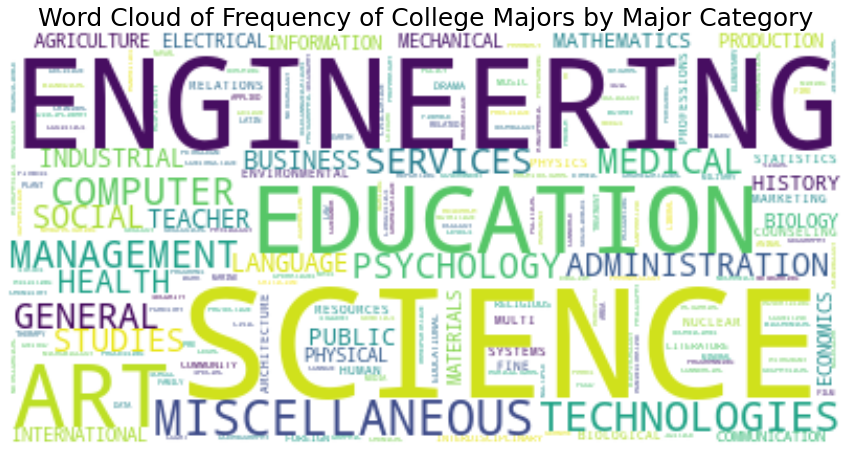

In [ ]:
#Creating a World Cloud to see the Frequency College Majors
major_corpus_1 = " ".join(department for department in college_majors['Major']) 
major_word_cloud_1 = WordCloud(collocations = False, background_color = 'white').generate(major_corpus_1)

plt.figure(figsize=(15,30))
plt.title("Word Cloud of Frequency of College Majors by Major Category", fontsize = 25)
plt.imshow(major_word_cloud_1, interpolation='bilinear')
plt.axis("off")
plt.show()

###**Temporal Visualization**

In [ ]:
historical_tuition['year'] = historical_tuition['year'].str[:4]
historical_tuition.head()

,type,year,tuition_type,tuition_cost
0,All Institutions,1985,All Constant,10893
1,All Institutions,1985,4 Year Constant,12274
2,All Institutions,1985,2 Year Constant,7508
3,All Institutions,1985,All Current,4885
4,All Institutions,1985,4 Year Current,5504


In [ ]:
historical_tuition_tt = historical_tuition.groupby(['year', 'tuition_type'])['tuition_cost'].mean()
historical_tuition_tt = historical_tuition_tt.reset_index()

historical_tuition_tos = historical_tuition.groupby(['year', 'type'])['tuition_cost'].mean()
historical_tuition_tos = historical_tuition_tos.reset_index()

In [ ]:
#Pivot both tables for the Correlation of Average Annual Tuition Cost based on Tuition Type 
#and Correlation of Average Annual Tuition Cost based on Type of School using HeatMap
historical_tuition_tt_pivot = pd.pivot_table(historical_tuition_tt, values = 'tuition_cost', index = 'tuition_type', columns = 'year')
historical_tuition_tos_pivot = pd.pivot_table(historical_tuition_tos, values = 'tuition_cost', index = 'type', columns = 'year')

[]

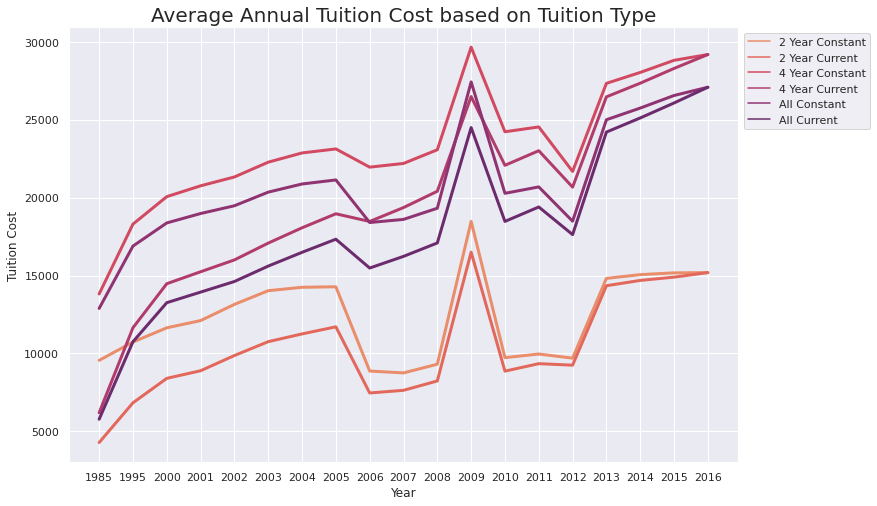

In [ ]:
#Line Plot of Average Annual Tuition Cost based on Tuition Type Anually
sns.set_style('darkgrid')
sns.set(rc = {'figure.figsize': (12, 8)})
ax_1 = sns.lineplot(data = historical_tuition_tt, x = 'year', y = 'tuition_cost', hue = 'tuition_type', palette = 'flare', legend = 'full', lw = 3)
ax_1.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.legend(bbox_to_anchor = (1, 1))
plt.ylabel('Tuition Cost')
plt.xlabel('Year')
plt.title('Average Annual Tuition Cost based on Tuition Type', fontsize = 20)
plt.plot()

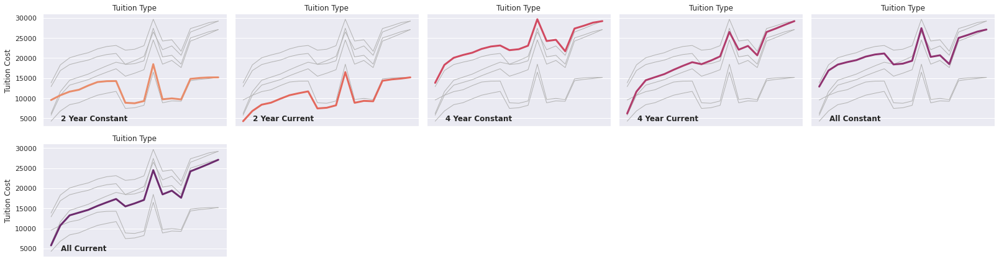

In [ ]:
#Small Multiple TS of Average Annual Tuition Cost based on Tuition Type Anually
g = sns.relplot(data = historical_tuition_tt, x = "year", y = "tuition_cost", col='tuition_type', hue='tuition_type', kind='line', palette='flare', 
                lw = 3, zorder = 5, col_wrap = 5, height = 3, aspect = 1.5, legend = False)
for time, ax in g.axes_dict.items():
    ax.text(0.1, 0.05, time, transform = ax.transAxes, fontweight = 'bold')
    sns.lineplot(data = historical_tuition_tt, x = "year", y = "tuition_cost", units = "tuition_type", estimator = None, 
               color = "0.7", linewidth = 1, ax = ax)
    ax.set_xticks('')
    g.set_titles("Tuition Type")
    g.set_axis_labels("", "Tuition Cost")
    g.tight_layout()

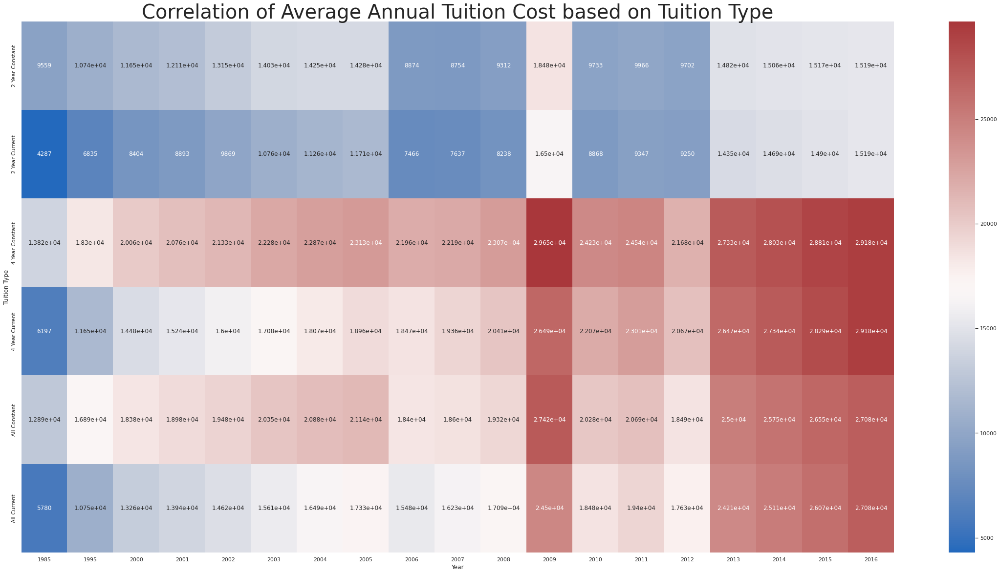

In [ ]:
#Correlation of Average Annual Tuition Cost based on Tuition Type
plt.figure(figsize = (40, 20))
plt.title("Correlation of Average Annual Tuition Cost based on Tuition Type", fontsize = 40)

sns.heatmap(historical_tuition_tt_pivot, annot = True, cmap = 'vlag', fmt = '0.4g') 
plt.xlabel('Year')
plt.ylabel('Tuition Type')

plt.show()

[]

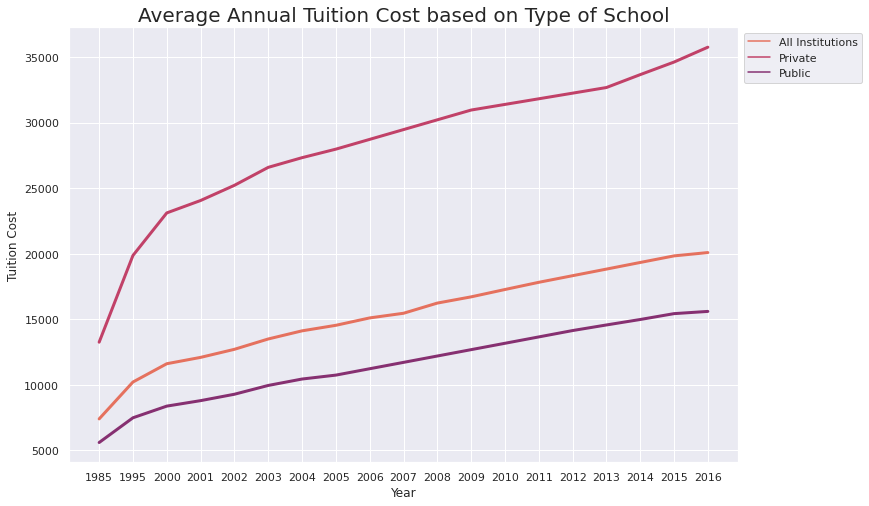

In [ ]:
#Line Plot of Average Annual Tuition Cost based on Type of School
sns.set_style('darkgrid')
sns.set(rc = {'figure.figsize': (12, 8)})
ax_1 = sns.lineplot(data = historical_tuition_tos, x = 'year', y = 'tuition_cost', hue = 'type', palette = 'flare', legend = 'full', lw = 3)
ax_1.xaxis.set_major_locator(ticker.MultipleLocator(1))
plt.legend(bbox_to_anchor = (1, 1))
plt.ylabel('Tuition Cost')
plt.xlabel('Year')
plt.title('Average Annual Tuition Cost based on Type of School', fontsize = 20)
plt.plot()

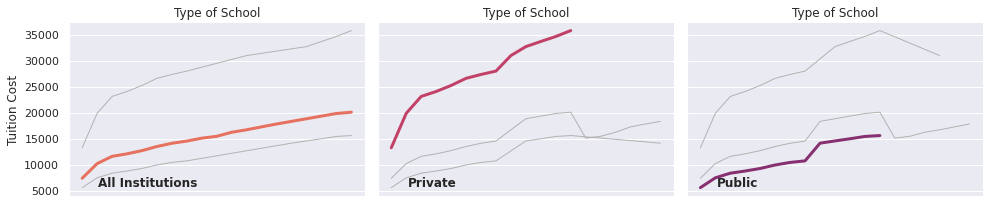

In [ ]:
#Small Multiple TS of Average Annual Tuition Cost based on Type of School Anually
g = sns.relplot(data = historical_tuition_tos, x = "year", y = "tuition_cost", col='type', hue='type', kind='line', palette='flare', 
                lw = 3, zorder = 5, col_wrap = 5, height = 3, aspect = 1.5, legend = False)
for time, ax in g.axes_dict.items():
    ax.text(0.1, 0.05, time, transform = ax.transAxes, fontweight = 'bold')
    sns.lineplot(data = historical_tuition_tos, x = "year", y = "tuition_cost", units = "type", estimator = None, 
               color = "0.7", linewidth = 1, ax = ax)
    ax.set_xticks('')
    g.set_titles("Type of School")
    g.set_axis_labels("", "Tuition Cost")
    g.tight_layout()

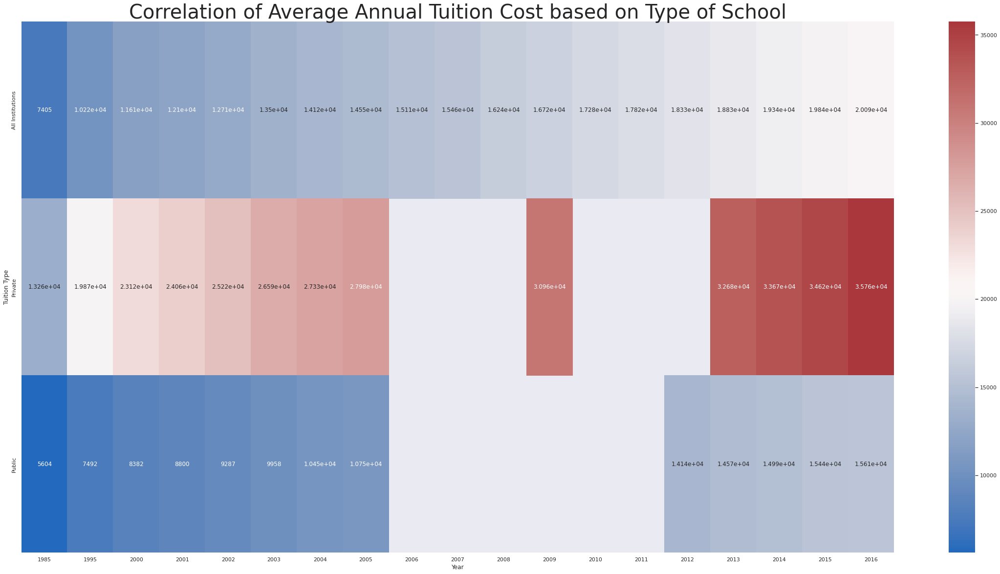

In [ ]:
#Correlation of Average Annual Tuition Cost based on Type of School
plt.figure(figsize = (40, 20))
plt.title("Correlation of Average Annual Tuition Cost based on Type of School", fontsize = 40)

sns.heatmap(historical_tuition_tos_pivot, annot = True, cmap = 'vlag', fmt = '0.4g') 
plt.xlabel('Year')
plt.ylabel('Tuition Type')

plt.show()

###**Geospatial Visualization**

In [ ]:
#Checking for null values
#The following are the columns extracted from the dataset with detected null values
count_nan = world_ranking['ger score'].isnull().sum()
print(count_nan)

12


In [ ]:
count_nan = world_ranking['ifr score'].isnull().sum()
print(count_nan)

98


In [ ]:
count_nan = world_ranking['isr score'].isnull().sum()
print(count_nan)

57


In [ ]:
#Replace null values with a 0 value
#Replace '-' values in the 'score scaled' column with 0 value
world_ranking['score scaled'] = world_ranking['score scaled'].replace('-','0')
world_ranking['ger score'] = world_ranking['ger score'].fillna(0)
world_ranking['ifr score'] = world_ranking['ifr score'].fillna(0)
world_ranking['isr score'] = world_ranking['isr score'].fillna(0)

#Use pandas to_numeric function to declare uniform data types
world_ranking['ifr score'] = pd.to_numeric(world_ranking['ifr score'])
world_ranking['isr score'] = pd.to_numeric(world_ranking['isr score'])
world_ranking['score scaled'] = pd.to_numeric(world_ranking['score scaled'])
world_ranking.head()

,Rank,institution,location code,location,ar score,ar rank,er score,er rank,fsr score,fsr rank,...,cpf rank,ifr score,ifr rank,isr score,isr rank,irn score,irn rank,ger score,ger rank,score scaled
0,1,Massachusetts Institute of Technology (MIT),US,United States,100.0,5,100.0,4,100.0,14,...,5,100.0,54,90.0,109,96.1,58,100.0,3,100.0
1,2,University of Cambridge,UK,United Kingdom,100.0,2,100.0,2,100.0,11,...,55,100.0,60,96.3,70,99.5,6,100.0,9,98.8
2,3,Stanford University,US,United States,100.0,4,100.0,5,100.0,6,...,9,99.8,74,60.3,235,96.3,55,100.0,2,98.5
3,4,University of Oxford,UK,United Kingdom,100.0,3,100.0,3,100.0,8,...,64,98.8,101,98.4,54,99.9,3,100.0,7,98.4
4,5,Harvard University,US,United States,100.0,1,100.0,1,99.4,35,...,2,76.9,228,66.9,212,100.0,1,100.0,1,97.6


In [ ]:
#Aggregate the needed columns by grouping values by location code (country code) and location (country)
world_ranking_mean = world_ranking.groupby(['location code', 'location']).mean()
world_ranking_mean = world_ranking_mean[['score scaled', 'ger score', 'ar score', 'ifr score', 'isr score']].reset_index()
world_ranking_mean.head()

,location code,location,score scaled,ger score,ar score,ifr score,isr score
0,AE,United Arab Emirates,10.081818,43.909091,13.090909,100.000000,80.772727
1,AM,Armenia,0.000000,89.800000,5.850000,7.300000,38.100000
2,AR,Argentina,7.352000,14.996000,13.952000,9.080000,12.748000
3,AT,Austria,27.800000,36.600000,22.375000,84.325000,70.987500
4,AU,Australia,31.302632,27.918421,30.421053,80.973684,72.984211


In [ ]:
#Proportional Symbol Map of Average Overall Score and Average Employment Score
average_score_academic = px.scatter_geo(world_ranking_mean, locations= 'location', locationmode= 'country names', 
                    color = 'score scaled', hover_name= 'location', size= 'ger score', scope= 'world', 
                    title = 'Proportional Symbol Map of Average Overall Score and Average Employment Score',
                    width = 1500, height = 800)
average_score_academic.show()

In [ ]:
#Choropleth Visualization of Average Academic Reputation Score of University Ranking Data
average_academic_reputation_score = px.choropleth(world_ranking_mean, lat = None, lon = None, locations = 'location', locationmode = 'country names', hover_name = 'location',
                   geojson = None, color = 'ar score', scope = 'world', title = 'Choropleth Visualization of Average Academic Reputation Score of University Ranking Data', width = 1500, height = 800)
average_academic_reputation_score.show()

In [ ]:
#Proportional Symbol Map of Average Faculty and Student Score of University Ranking Data
average_faculty_student_reputation = px.scatter_geo(world_ranking_mean, locations= 'location', locationmode= 'country names', 
                    color = 'isr score', hover_name= 'location', size= 'ifr score', scope= 'world', 
                    title = 'Proportional Symbol Map of Average Faculty and Student Score of University Ranking Data',
                    width = 1500, height = 800)
average_faculty_student_reputation.show()

## Geo Temporal Visual

In [ ]:
tuition_income.rename(columns = {'state':'state code'}, inplace = True)

In [ ]:
#Get State Names from State codes
states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}


tuition_income['state name'] = tuition_income['state code'].replace(states)

In [ ]:
#Reposition 'state_name' column
tuition_income = tuition_income.iloc[:,[0,7,1,2,3,4,5,6]]
tuition_income.head()

,name,state name,state code,total_price,year,campus,net_cost,income_lvl
0,Piedmont International University,North Carolina,NC,20174,2016,On Campus,11475.00000,"0 to 30,000"
1,Piedmont International University,North Carolina,NC,20174,2016,On Campus,11451.00000,"30,001 to 48,000"
2,Piedmont International University,North Carolina,NC,20174,2016,On Campus,16229.00000,"48_001 to 75,000"
3,Piedmont International University,North Carolina,NC,20174,2016,On Campus,15592.00000,"75,001 to 110,000"
4,Piedmont International University,North Carolina,NC,20514,2017,On Campus,11668.39249,"0 to 30,000"


In [ ]:
#Yearly Data Frame

yearly = tuition_income.groupby(['state name', 'state code', 'year']).mean()
yearly = yearly[['total_price', 'net_cost']].reset_index()
yearly.head()

,state name,state code,year,total_price,net_cost
0,Alabama,AL,2010,19321.714286,11743.331797
1,Alabama,AL,2011,20853.210654,13888.007264
2,Alabama,AL,2012,21942.640449,14500.925843
3,Alabama,AL,2013,22417.205357,14796.049107
4,Alabama,AL,2014,24010.491954,15623.358621


In [ ]:
yearly_fee = px.choropleth(yearly, lat = None, lon = None, locations ="state code", locationmode = "USA-states",
                   geojson = None, color = "total_price", scope = "usa", center = None, 
                   title = "Choropleth Visualization of Yearly Average of Total Price of Tuition Fees in USA with Animation", 
                   width = None, height = None, animation_frame = "year", category_orders={"year": [2010,2011,2012,2013,2014,2015,...]}, hover_name = "state name")
yearly_fee.show()

In [ ]:
yearly_cost = px.choropleth(yearly, lat = None, lon = None, locations ="state code", locationmode = "USA-states",
                   geojson = None, color = "net_cost", scope = "usa", center = None, 
                   title = "Choropleth Visualization of Yearly Average of Net Cost of Tuition Fees in USA with Animation", 
                   width = None, height = None, animation_frame = "year", category_orders={"year": [2010,2011,2012,2013,2014,2015,...]}, hover_name = "state name")
yearly_cost.show()

In [ ]:
#Average per campus type
campus = tuition_income.groupby(['state name', 'state code', 'year', 'campus']).mean()
campus = campus[['total_price', 'net_cost']].reset_index()
campus.head()

,state name,state code,year,campus,total_price,net_cost
0,Alabama,AL,2010,Off Campus,19321.714286,11743.331797
1,Alabama,AL,2011,Off Campus,20205.263598,13093.895397
2,Alabama,AL,2011,On Campus,21743.206897,14978.770115
3,Alabama,AL,2012,Off Campus,21521.230769,14109.890110
4,Alabama,AL,2012,On Campus,22611.505814,15121.581395


In [ ]:
on_campus = campus.loc[campus['campus'] == "On Campus"]
on_campus.head()

,state name,state code,year,campus,total_price,net_cost
2,Alabama,AL,2011,On Campus,21743.206897,14978.770115
4,Alabama,AL,2012,On Campus,22611.505814,15121.581395
6,Alabama,AL,2013,On Campus,23412.356322,15472.500000
8,Alabama,AL,2014,On Campus,24289.556213,15682.189349
10,Alabama,AL,2015,On Campus,24598.439306,15867.485549


In [ ]:
off_campus = campus.loc[campus['campus'] == "Off Campus"]
off_campus.head()

,state name,state code,year,campus,total_price,net_cost
0,Alabama,AL,2010,Off Campus,19321.714286,11743.331797
1,Alabama,AL,2011,Off Campus,20205.263598,13093.895397
3,Alabama,AL,2012,Off Campus,21521.230769,14109.890110
5,Alabama,AL,2013,Off Campus,21785.248175,14366.478102
7,Alabama,AL,2014,Off Campus,23833.191729,15585.981203


In [ ]:
oncampus_geo = px.scatter_geo(on_campus, lat = None, lon = None, locations ="state code", locationmode = "USA-states", 
                    geojson= None, featureidkey= None, color = 'total_price', text= None, symbol= None, 
                    facet_row= None, facet_col= None, facet_col_wrap= 0, facet_row_spacing= None, 
                    facet_col_spacing= None, hover_name= None, hover_data= None, custom_data= None, 
                    size= 'net_cost', animation_frame= 'year', animation_group = None, category_orders= None, 
                    labels= None, color_discrete_sequence = None, color_discrete_map = None, color_continuous_scale= None, 
                    range_color= None, color_continuous_midpoint = None, symbol_sequence= None, symbol_map = None, 
                    opacity= None, size_max= None, scope= 'usa', center= None, fitbounds= None, basemap_visible = None, 
                    title = 'Proportional Symbol Map of Average Yearly On Campus Total Price and Net Cost', template = None, width= None, height= None)
oncampus_geo.show()

In [ ]:
offcampus_geo = px.scatter_geo(off_campus, lat = None, lon = None, locations ="state code", locationmode = "USA-states", 
                    geojson= None, featureidkey= None, color = 'total_price', text= None, symbol= None, 
                    facet_row= None, facet_col= None, facet_col_wrap= 0, facet_row_spacing= None, 
                    facet_col_spacing= None, hover_name= None, hover_data= None, custom_data= None, 
                    size= 'net_cost', animation_frame= 'year', animation_group = None, category_orders= None, 
                    labels= None, color_discrete_sequence = None, color_discrete_map = None, color_continuous_scale= None, 
                    range_color= None, color_continuous_midpoint = None, symbol_sequence= None, symbol_map = None, 
                    opacity= None, size_max= None, scope= 'usa', center= None, fitbounds= None, basemap_visible = None, 
                    title = 'Proportional Symbol Map of Average Yearly Off Campus Total Price and Net Cost', template = None, width= None, height= None)
offcampus_geo.show()

In [ ]:
#Average per income level type
income_lvl = tuition_income.groupby(['state name', 'state code', 'year', 'income_lvl']).mean()
income_lvl = income_lvl[['total_price', 'net_cost']].reset_index()
income_lvl.head()

,state name,state code,year,income_lvl,total_price,net_cost
0,Alabama,AL,2010,"0 to 30,000",19219.800000,9778.981818
1,Alabama,AL,2010,"30,001 to 48,000",18868.500000,10494.314815
2,Alabama,AL,2010,"48_001 to 75,000",18452.714286,11992.938776
3,Alabama,AL,2010,"75,001 to 110,000",19595.303030,13360.939394
4,Alabama,AL,2010,"Over 110,000",21769.076923,15969.269231


In [ ]:
zero_30 = income_lvl.loc[income_lvl['income_lvl'] == "0 to 30,000"]
zero_30.head()

,state name,state code,year,income_lvl,total_price,net_cost
0,Alabama,AL,2010,"0 to 30,000",19219.800000,9778.981818
5,Alabama,AL,2011,"0 to 30,000",20352.938776,11635.112245
10,Alabama,AL,2012,"0 to 30,000",21529.000000,12148.750000
15,Alabama,AL,2013,"0 to 30,000",22028.790476,12609.542857
20,Alabama,AL,2014,"0 to 30,000",22986.883495,12869.359223


In [ ]:
income_scatter = px.scatter( zero_30, y="total_price", x="net_cost", color="state name", symbol=None, size=None, 
                  hover_name="state name", hover_data=None, custom_data=None, text=None, 
                  facet_row=None, facet_col=None, facet_col_wrap=0, facet_row_spacing=None,
                  facet_col_spacing=None, error_x=None, error_x_minus=None, error_y=None, 
                  error_y_minus=None, animation_frame="year", animation_group="state name", category_orders=None, 
                  labels=dict(total_price = "Total Price", net_cost = "Net Cost", state_name = "State"), 
                  orientation=None, color_discrete_sequence=None, 
                  color_discrete_map=None, color_continuous_scale=None, range_color=None, 
                  color_continuous_midpoint=None, symbol_sequence=None, symbol_map=None, 
                  opacity=None, size_max=None, marginal_x=None, marginal_y=None, trendline='ols', 
                  trendline_options=None, trendline_color_override=None, trendline_scope='trace', 
                  log_x=True, log_y=False, range_y=[0, 50000], range_x=[6000, 30000], render_mode='auto', 
                  title='Scatter Plot of USA States tuition based on Yearly Reported Average Total Price and Net Cost per Income level of 0-30,000 (2010-2018)', 
                  template=None, width=None, height=None)
income_scatter.show()

###**Network Visualization**

In [ ]:
college_majors['constant'] = 1
college_majors.head()

,Rank,Major_code,Major,Total,Men,Women,Major_category,ShareWomen,Sample_size,Employed,...,Full_time_year_round,Unemployed,Unemployment_rate,Median,P25th,P75th,College_jobs,Non_college_jobs,Low_wage_jobs,constant
0,1,2419,PETROLEUM ENGINEERING,2339.0,2057.0,282.0,Engineering,0.1206,36,1976,...,1207,37,0.0184,110000,95000,125000,1534,364,193,1
1,2,2416,MINING AND MINERAL ENGINEERING,756.0,679.0,77.0,Engineering,0.1019,7,640,...,388,85,0.1172,75000,55000,90000,350,257,50,1
2,3,2415,METALLURGICAL ENGINEERING,856.0,725.0,131.0,Engineering,0.1530,3,648,...,340,16,0.0241,73000,50000,105000,456,176,0,1
3,4,2417,NAVAL ARCHITECTURE AND MARINE ENGINEERING,1258.0,1123.0,135.0,Engineering,0.1073,16,758,...,692,40,0.0501,70000,43000,80000,529,102,0,1
4,5,2405,CHEMICAL ENGINEERING,32260.0,21239.0,11021.0,Engineering,0.3416,289,25694,...,16697,1672,0.0611,65000,50000,75000,18314,4440,972,1


In [ ]:
edges = pd.concat([college_majors['Median'], college_majors['Major']], axis=1)
edges['tuple'] = list(zip(edges['Median'], edges['Major']))
edges.head()

,Median,Major,tuple
0,110000,PETROLEUM ENGINEERING,"(110000, PETROLEUM ENGINEERING)"
1,75000,MINING AND MINERAL ENGINEERING,"(75000, MINING AND MINERAL ENGINEERING)"
2,73000,METALLURGICAL ENGINEERING,"(73000, METALLURGICAL ENGINEERING)"
3,70000,NAVAL ARCHITECTURE AND MARINE ENGINEERING,"(70000, NAVAL ARCHITECTURE AND MARINE ENGINEER..."
4,65000,CHEMICAL ENGINEERING,"(65000, CHEMICAL ENGINEERING)"


In [ ]:
G = nx.Graph()
G.add_nodes_from(edges['Median'], bipartite=0)
G.add_nodes_from(edges['Major'], bipartite=1)
G.add_edges_from(edges['tuple'])

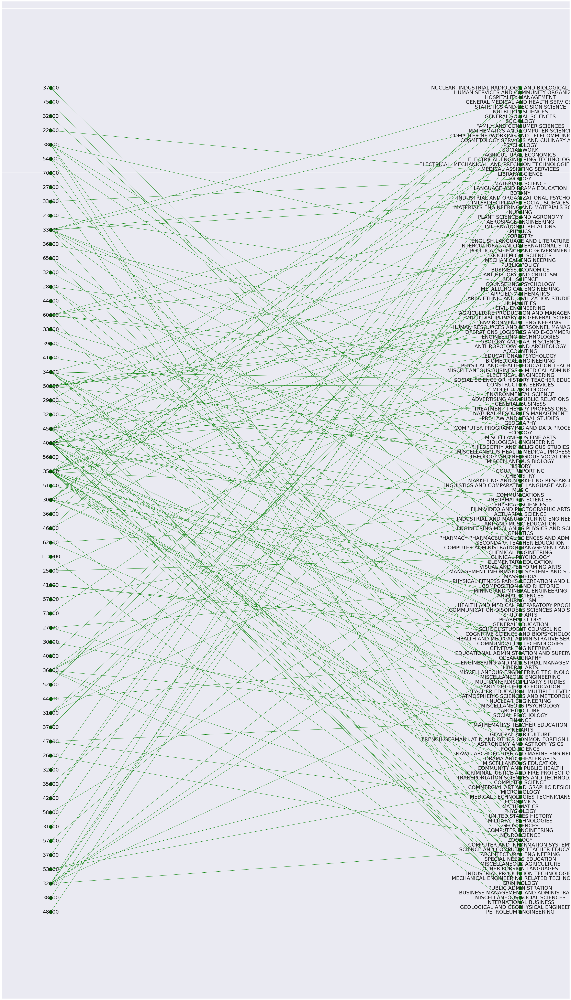

In [ ]:
ax = plt.subplots(figsize=(50,90))
nx.draw_networkx(G, pos = bipartite_layout(G, college_majors['Median']), with_labels=True, font_size=25, edge_color='green', node_color = 'darkgreen')

In [ ]:
college_majors['Men_per_Major'] = 'Total Men'
college_majors.head()

,Rank,Major_code,Major,Total,Men,Women,Major_category,ShareWomen,Sample_size,Employed,...,Unemployed,Unemployment_rate,Median,P25th,P75th,College_jobs,Non_college_jobs,Low_wage_jobs,constant,Men_per_Major
0,1,2419,PETROLEUM ENGINEERING,2339.0,2057.0,282.0,Engineering,0.1206,36,1976,...,37,0.0184,110000,95000,125000,1534,364,193,1,Total Men
1,2,2416,MINING AND MINERAL ENGINEERING,756.0,679.0,77.0,Engineering,0.1019,7,640,...,85,0.1172,75000,55000,90000,350,257,50,1,Total Men
2,3,2415,METALLURGICAL ENGINEERING,856.0,725.0,131.0,Engineering,0.1530,3,648,...,16,0.0241,73000,50000,105000,456,176,0,1,Total Men
3,4,2417,NAVAL ARCHITECTURE AND MARINE ENGINEERING,1258.0,1123.0,135.0,Engineering,0.1073,16,758,...,40,0.0501,70000,43000,80000,529,102,0,1,Total Men
4,5,2405,CHEMICAL ENGINEERING,32260.0,21239.0,11021.0,Engineering,0.3416,289,25694,...,1672,0.0611,65000,50000,75000,18314,4440,972,1,Total Men


In [ ]:
edges = pd.concat([college_majors['Men_per_Major'], college_majors['Major']], axis=1)
edges['tuple'] = list(zip(edges['Men_per_Major'], edges['Major']))
edges.head()

,Men_per_Major,Major,tuple
0,Total Men,PETROLEUM ENGINEERING,"(Total Men, PETROLEUM ENGINEERING)"
1,Total Men,MINING AND MINERAL ENGINEERING,"(Total Men, MINING AND MINERAL ENGINEERING)"
2,Total Men,METALLURGICAL ENGINEERING,"(Total Men, METALLURGICAL ENGINEERING)"
3,Total Men,NAVAL ARCHITECTURE AND MARINE ENGINEERING,"(Total Men, NAVAL ARCHITECTURE AND MARINE ENGI..."
4,Total Men,CHEMICAL ENGINEERING,"(Total Men, CHEMICAL ENGINEERING)"


In [ ]:
G = nx.Graph()
G.add_nodes_from(edges['Men_per_Major'])
G.add_nodes_from(edges['Major'])
G.add_edges_from(edges['tuple'])

In [ ]:
college_majors['Men_Divided'] = college_majors['Men'].divide(10000)

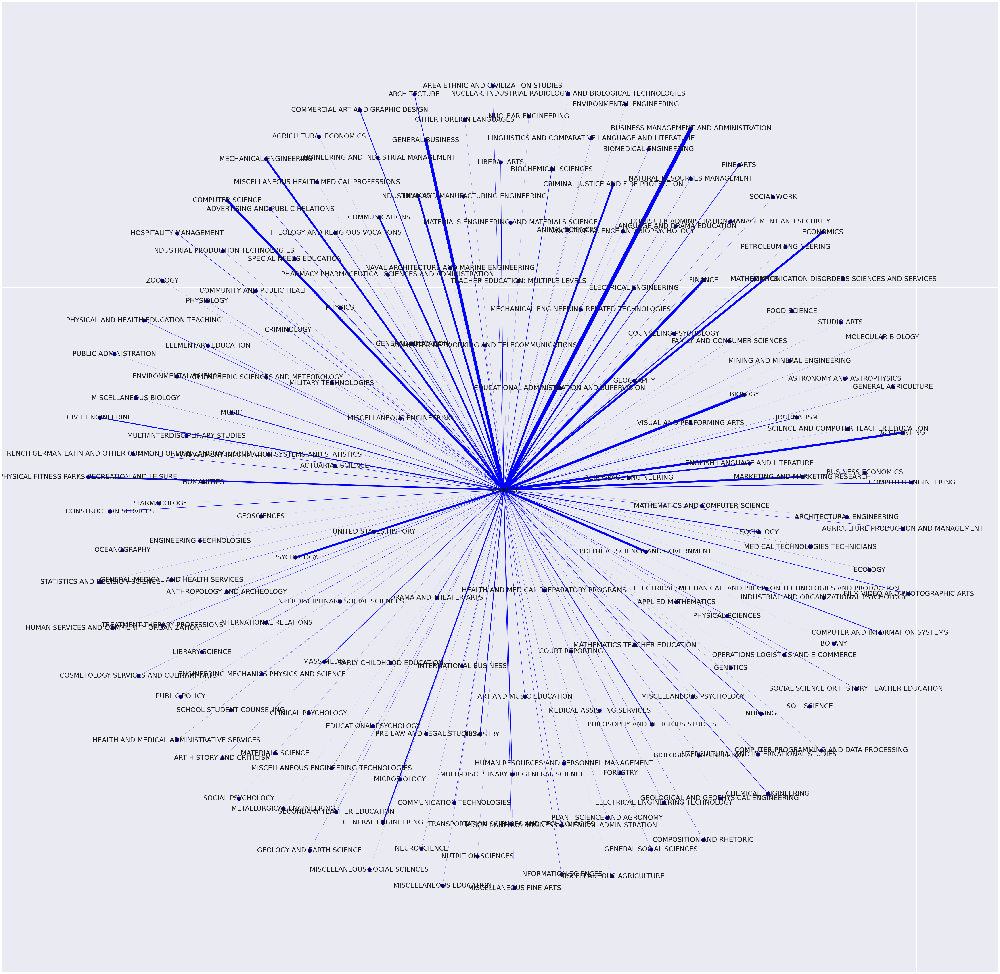

In [ ]:
ax = plt.subplots(figsize=(80,80))
nx.draw_networkx(G, pos = nx.spring_layout(G, scale=1, center=None, dim=2), with_labels=True, width=college_majors['Men_Divided'] , font_size=30, 
                 edge_color='blue', node_color = 'darkblue')

In [ ]:
college_majors['Women_per_Major'] = 'Total Women'
college_majors.head()

,Rank,Major_code,Major,Total,Men,Women,Major_category,ShareWomen,Sample_size,Employed,...,Median,P25th,P75th,College_jobs,Non_college_jobs,Low_wage_jobs,constant,Men_per_Major,Men_Divided,Women_per_Major
0,1,2419,PETROLEUM ENGINEERING,2339.0,2057.0,282.0,Engineering,0.1206,36,1976,...,110000,95000,125000,1534,364,193,1,Total Men,0.2057,Total Women
1,2,2416,MINING AND MINERAL ENGINEERING,756.0,679.0,77.0,Engineering,0.1019,7,640,...,75000,55000,90000,350,257,50,1,Total Men,0.0679,Total Women
2,3,2415,METALLURGICAL ENGINEERING,856.0,725.0,131.0,Engineering,0.1530,3,648,...,73000,50000,105000,456,176,0,1,Total Men,0.0725,Total Women
3,4,2417,NAVAL ARCHITECTURE AND MARINE ENGINEERING,1258.0,1123.0,135.0,Engineering,0.1073,16,758,...,70000,43000,80000,529,102,0,1,Total Men,0.1123,Total Women
4,5,2405,CHEMICAL ENGINEERING,32260.0,21239.0,11021.0,Engineering,0.3416,289,25694,...,65000,50000,75000,18314,4440,972,1,Total Men,2.1239,Total Women


In [ ]:
edges = pd.concat([college_majors['Women_per_Major'], college_majors['Major']], axis=1)
edges['tuple'] = list(zip(edges['Women_per_Major'], edges['Major']))
edges.head()

,Women_per_Major,Major,tuple
0,Total Women,PETROLEUM ENGINEERING,"(Total Women, PETROLEUM ENGINEERING)"
1,Total Women,MINING AND MINERAL ENGINEERING,"(Total Women, MINING AND MINERAL ENGINEERING)"
2,Total Women,METALLURGICAL ENGINEERING,"(Total Women, METALLURGICAL ENGINEERING)"
3,Total Women,NAVAL ARCHITECTURE AND MARINE ENGINEERING,"(Total Women, NAVAL ARCHITECTURE AND MARINE EN..."
4,Total Women,CHEMICAL ENGINEERING,"(Total Women, CHEMICAL ENGINEERING)"


In [ ]:
G = nx.Graph()
G.add_nodes_from(edges['Women_per_Major'])
G.add_nodes_from(edges['Major'])
G.add_edges_from(edges['tuple'])

In [ ]:
college_majors['Women_Divided'] = college_majors['Women'].divide(10000)

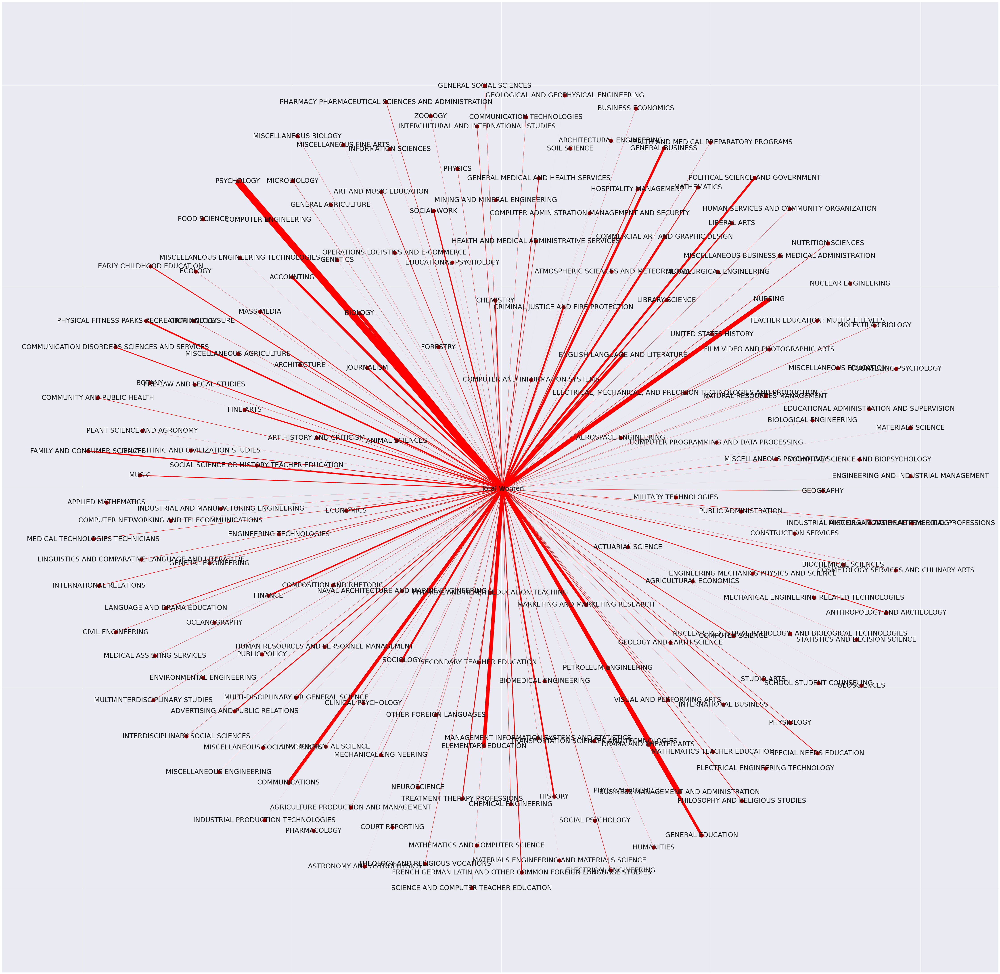

In [ ]:
ax = plt.subplots(figsize=(80,80))
nx.draw_networkx(G, pos = nx.spring_layout(G, scale=1, center=None, dim=2), with_labels=True, width=college_majors['Women_Divided'] , 
                 font_size=30, edge_color='red', node_color = 'darkred')

###**Heirarchial Visualization**

In [ ]:
world_ranking['constant'] = 1

In [ ]:
#Treemap of Universities by Country
tm_country_university = px.treemap(data_frame = world_ranking, names=None, values = world_ranking['constant'], parents=None, ids = None,
                path=['location', 'institution'], color=None, 
                color_continuous_scale='viridis', range_color=None, color_continuous_midpoint=None, 
                color_discrete_sequence=None, color_discrete_map=None, hover_name=None, 
                hover_data=['score scaled'], custom_data=None, labels=None, title='Treemap Visualization of Universities per Country', 
                template=None, width=None, height=None, branchvalues=None, maxdepth=None) 

tm_country_university.show()

In [ ]:
##Cursor Parking Lot for minimal interference with changes in lines 
#____________________________________
#| ___     ___     ___   ___   ___  |
#|      |       |      |     |      |
#|      |       |      |     |      |
#|__________________________________|
#  /\_/\    (\_/)  (\_/)    A___A
# (˶•o•˶)   (•ω•)  (•Ɛ•)   (•⤙• )
# ଘ(ა🍱)   (ა🍙૮)｡(ა❤️૮)｡  (🍜٩ )੭   